In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import matplotlib.colors as mcolors
from scipy.spatial import Delaunay, Voronoi, voronoi_plot_2d
import matplotlib.patches as patches
from matplotlib import cm
from scipy import stats
from scipy.ndimage import label
from skimage import measure
import pandas as pd
from collections import defaultdict
import os

## Load the data (membrane channel and its segmentation using MicroSAM)

In [2]:
# Define the base directory relative to the current script or working directory
base_dir = os.path.join(os.getcwd(), "Embryo1")

# Construct relative paths
image_path = os.path.join(base_dir, "Emb1_C2_membrane.tif")
mask_path = os.path.join(base_dir, "Emb1_membrane_masks.tif")

# Load the images
image_3d = tifffile.imread(image_path) # Original image of membrane
masks_3d = tifffile.imread(mask_path) # Segmentation using MicroSAM

In [3]:
# Print the shape of the 3D image
print("Shape of image_3d:", image_3d.shape)

Shape of image_3d: (24, 1024, 1024)


## Analysis for one 2D-slice

### Calculation of Voronoi

In [4]:
# Assuming masks_3d is your 3D array
image_layer = image_3d[12]
mask_layer = masks_3d[12]

# # Check the range of masks
min_value = np.min(masks_3d) # 0 
max_value = np.max(masks_3d) # 1556
num_masks = max_value - min_value

In [5]:
centroids = []

# Loop through each mask
for mask_value in range(1, max_value+1):  
    # Create a binary mask for each mask value, marking the pixels that belong to the current mask.
    binary_mask = mask_layer == mask_value 
    
    # Check if there are any pixels belonging to this mask
    if np.any(binary_mask):
        # Get the coordinates of the mask
        coords = np.argwhere(binary_mask)
        # Calculate the centroid
        centroid = np.mean(coords, axis=0)
        centroids.append(centroid)


# Convert centroids to an array for easier plotting
centroids = np.array(centroids)


In [6]:
# Compute the voronoi using centroids
vor = Voronoi(centroids)

In [7]:
# Filter valid regions (exclude regions with vertices at infinity and too far)
valid_regions = []
for region in vor.regions:
    if len(region) > 0 and -1 not in region:  # Exclude empty regions and regions with infinite vertices
        valid = True
        for vertex_index in region:
            vertex = vor.vertices[vertex_index]
            x, y = vertex[0], vertex[1]
            
            # Check if the vertex is within the specified bounds
            if not (10 <= x <= 950 and -1000 <= y <= 2000):
                valid = False
                break
        
        if valid:
            valid_regions.append(region)

In [8]:
# Calculate the number of vertices for each valid region
region_vertex_counts = [len(region) for region in valid_regions]

### Compare the segmentation using MicroSAM and the edges of Voronoi diagram

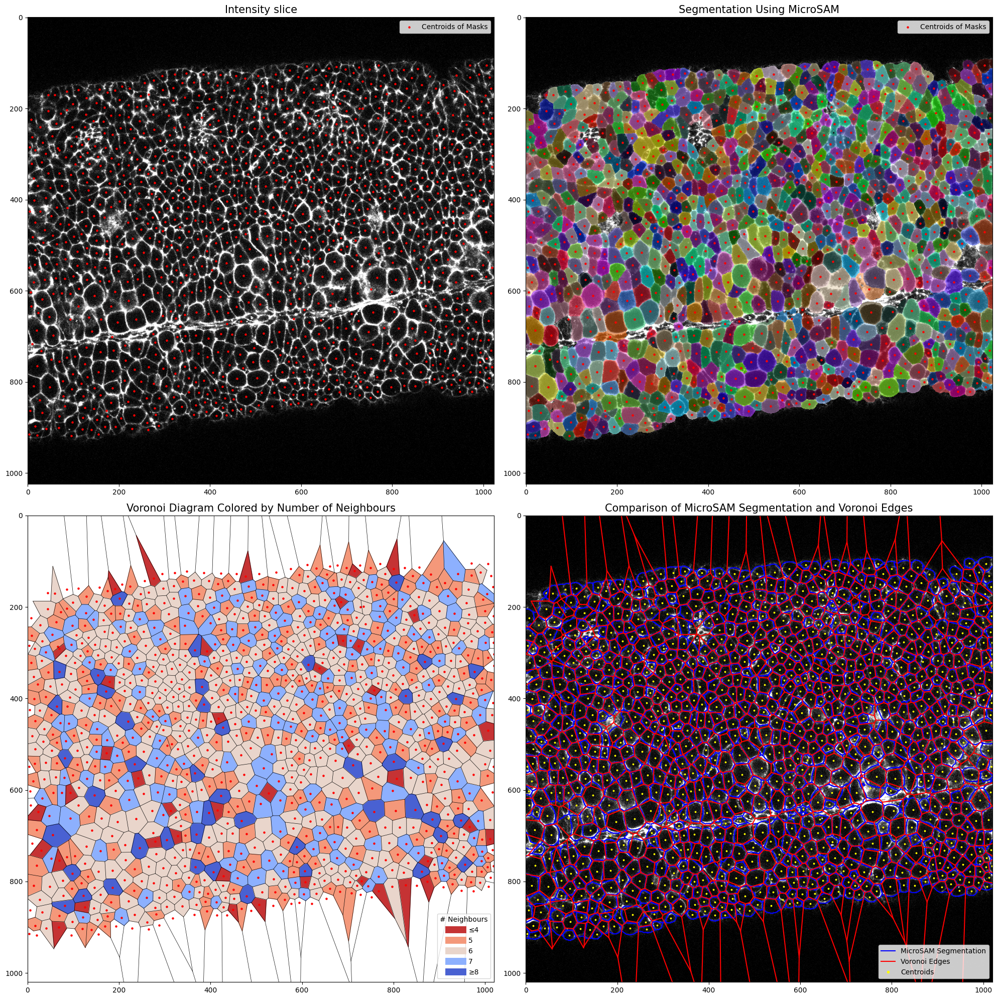

In [9]:
# Set up a 2x2 figure layout
fig, axes = plt.subplots(2, 2, figsize=(20, 20))

# ----- Intensity slice -----
axes[0, 0].imshow(image_layer, cmap='gray')
axes[0, 0].scatter(centroids[:, 1], centroids[:, 0], color='red', marker='o', s=5, label='Centroids of Masks')
axes[0, 0].set_title('Intensity slice', fontsize=15)
axes[0, 0].legend()

# ----- Segmentation using MicroSAM -----
# Generate unique colors for each mask value excluding the background (0)
unique_masks = np.unique(mask_layer)
num_masks = len(unique_masks) - 1  # Exclude background
np.random.seed(20)  # Set seed for reproducibility
colors = np.random.rand(num_masks, 3)  # Random RGB colors

# Insert a transparent color for the background
colors_with_bg = np.vstack([[0, 0, 0, 0], np.column_stack([colors, np.ones(num_masks)])])  # BG is transparent

# Create a discrete colormap from the colors with transparent background
random_cmap = mcolors.ListedColormap(colors_with_bg)

# Plot the grayscale image on the right
axes[0, 1].imshow(image_layer, cmap='gray')
# Overlay the segmentation mask with transparency for background
im = axes[0, 1].imshow(mask_layer, cmap=random_cmap, interpolation='nearest', alpha=0.6)  # Adjust alpha for overlay transparency
axes[0, 1].scatter(centroids[:, 1], centroids[:, 0], color='red', marker='o', s=5, label='Centroids of Masks')
axes[0, 1].set_title('Segmentation Using MicroSAM', fontsize=15)
axes[0, 1].legend()

# ----- Voronoi diagram Colored by Number of Neighbours -----
# Use predefined colors for each vertex count
color_map = {
    4: cm.coolwarm(0.95),   # Color for ≤4 vertices
    5: cm.coolwarm(0.75),   # Color for 5 vertices
    6: cm.coolwarm(0.55),   # Color for 6 vertices
    7: cm.coolwarm(0.25),   # Color for 7 vertices
    8: cm.coolwarm(0.05)    # Color for ≥8 vertices
}

# Define colors for vertex counts outside the standard 4-8 range
def get_color(vertex_count):
    if vertex_count <= 4:
        return color_map[4]
    elif vertex_count >= 8:
        return color_map[8]
    else:
        return color_map.get(vertex_count, 'gray')  # Default to gray if not specified

# Plot Voronoi ridges (edges) manually 
for simplex in vor.ridge_vertices:
    simplex = np.asarray(simplex)
    if np.all(simplex >= 0):
        axes[1, 0].plot(vor.vertices[simplex, 1], vor.vertices[simplex, 0], 'k-', lw=0.5)

# Color regions based on the number of vertices 
for region in valid_regions:
    polygon = np.array([vor.vertices[i] for i in region])
    vertex_count = len(region)
    color = get_color(vertex_count)
    axes[1, 0].fill(polygon[:, 1], polygon[:, 0], color=color, alpha=1)

# Plot centroids in the Voronoi plot
axes[1, 0].scatter(centroids[:, 1], centroids[:, 0], color='red', marker='o', s=5, label='Centroids')

# Add legend for vertex counts
legend_patches = [
    plt.Line2D([0], [0], color=color_map[4], lw=10, label='≤4'),
    plt.Line2D([0], [0], color=color_map[5], lw=10, label='5'),
    plt.Line2D([0], [0], color=color_map[6], lw=10, label='6'),
    plt.Line2D([0], [0], color=color_map[7], lw=10, label='7'),
    plt.Line2D([0], [0], color=color_map[8], lw=10, label='≥8')
]
axes[1, 0].legend(handles=legend_patches, title='# Neighbours', loc='lower right')

# Set aspect ratio and limits for the Voronoi plot
axes[1, 0].set_aspect('equal')
axes[1, 0].set_xlim(0, 1020)
axes[1, 0].set_ylim(1020, 0)  
axes[1, 0].set_title('Voronoi Diagram Colored by Number of Neighbours', fontsize=15)

# ----- compare the segmentation from MicroSAM and the edges of Voronoi diagram -----
# Plot the original grayscale image
axes[1, 1].imshow(image_layer, cmap='gray')

# Find boundaries of each mask in mask_layer and overlay in blue
for mask_value in unique_masks:
    if mask_value == 0:  # Skip background
        continue
    # Create binary mask for the current region
    binary_mask = (mask_layer == mask_value)
    # Find contours/boundaries
    contours = measure.find_contours(binary_mask, level=0.5)
    for contour in contours:
        axes[1, 1].plot(contour[:, 1], contour[:, 0], color='blue', linewidth=1.5)  # Larger linewidth for blue boundaries

# Plot Voronoi edges in red
for simplex in vor.ridge_vertices:
    simplex = np.asarray(simplex)
    if np.all(simplex >= 0):  # Ignore ridges that extend to infinity
        axes[1, 1].plot(vor.vertices[simplex, 1], vor.vertices[simplex, 0], 'r-', lw=1.5)  # Larger linewidth for red edges

# Plot centroids for reference
axes[1, 1].scatter(centroids[:, 1], centroids[:, 0], color='yellow', marker='o', s=3, label='Centroids')

# Set axis limits
axes[1, 1].set_aspect('equal')
axes[1, 1].set_xlim(0, 1020)
axes[1, 1].set_ylim(1020, 0)

# Add legend for clarity, including centroids label
legend_patches = [
    plt.Line2D([0], [0], color='blue', lw=1.5, label='MicroSAM Segmentation'),
    plt.Line2D([0], [0], color='red', lw=1.5, label='Voronoi Edges'),
    plt.Line2D([0], [0], marker='o', color='yellow', markersize=3, linestyle='None', label='Centroids')
]
axes[1, 1].legend(handles=legend_patches, loc='lower right')

axes[1, 1].set_title("Comparison of MicroSAM Segmentation and Voronoi Edges", fontsize=15)

# ----- Show the combined figure -----
plt.tight_layout()
plt.show()


## Analysis of all slices

### Voronoi Diagrams for All Slice

In [10]:
# Define the color mapping for vertices count
color_map = {
    4: cm.coolwarm(0.95),  # Color for ≤4 vertices
    5: cm.coolwarm(0.75),  # Color for 5 vertices
    6: cm.coolwarm(0.55),  # Color for 6 vertices
    7: cm.coolwarm(0.25),  # Color for 7 vertices
    8: cm.coolwarm(0.05)   # Color for ≥8 vertices
}

# Function to get color based on vertex count
def get_color(vertex_count):
    if vertex_count <= 4:
        return color_map[4]
    elif vertex_count >= 8:
        return color_map[8]
    else:
        return color_map.get(vertex_count, 'gray')  # Default to gray if not specified


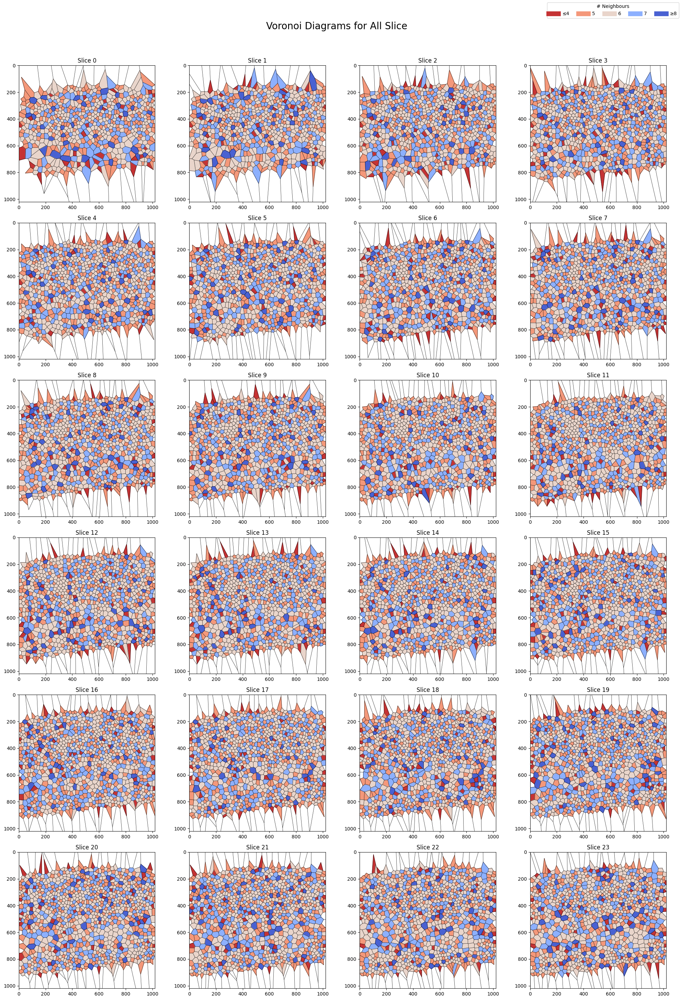

In [11]:
# Set up a 6x4 plot grid
fig, axes = plt.subplots(6, 4, figsize=(20, 30))
axes = axes.flatten()  # Flatten axes array for easy indexing

# Iterate over slices in masks_3d up to 24 slices (for a 6x4 grid)
for i in range(min(24, masks_3d.shape[0])):
    mask_layer = masks_3d[i]
    
    # Calculate centroids for the current slice
    centroids = []
    max_value = np.max(mask_layer)
    
    for mask_value in range(1, max_value + 1):
        binary_mask = mask_layer == mask_value
        if np.any(binary_mask):
            coords = np.argwhere(binary_mask)
            centroid = np.mean(coords, axis=0)
            centroids.append(centroid)

    # Convert centroids to an array
    centroids = np.array(centroids)
    
    # Compute the Voronoi diagram
    if len(centroids) > 0:
        vor = Voronoi(centroids)

        # Filter valid regions (exclude regions with vertices at infinity and too far)
        valid_regions = []
        for region in vor.regions:
            if len(region) > 0 and -1 not in region:
                valid = True
                for vertex_index in region:
                    vertex = vor.vertices[vertex_index]
                    x, y = vertex[0], vertex[1]
                    if not (10 <= x <= 950 and -1000 <= y <= 2000):
                        valid = False
                        break
                if valid:
                    valid_regions.append(region)
        
        # Plotting each slice
        ax = axes[i]
        
        # Plot Voronoi ridges (edges)
        for simplex in vor.ridge_vertices:
            simplex = np.asarray(simplex)
            if np.all(simplex >= 0):
                ax.plot(vor.vertices[simplex, 1], vor.vertices[simplex, 0], 'k-', lw=0.5)

        # Color regions based on the number of vertices
        for region in valid_regions:
            polygon = np.array([vor.vertices[i] for i in region])
            vertex_count = len(region)
            color = get_color(vertex_count)
            ax.fill(polygon[:, 1], polygon[:, 0], color=color, alpha=1)
        
        # # Plot centroids in the Voronoi plot
        # ax.scatter(centroids[:, 1], centroids[:, 0], color='red', marker='o', s=5)

        # Set title for each subplot
        ax.set_title(f'Slice {i}')
        ax.set_aspect('equal')
        ax.set_xlim(0, 1020)
        ax.set_ylim(1020, 0)

# Hide any unused subplots
for j in range(i+1, 24):
    axes[j].axis('off')


# Add a legend for color coding of vertex count
legend_patches = [
    plt.Line2D([0], [0], color=color_map[4], lw=10, label='≤4'),
    plt.Line2D([0], [0], color=color_map[5], lw=10, label='5'),
    plt.Line2D([0], [0], color=color_map[6], lw=10, label='6'),
    plt.Line2D([0], [0], color=color_map[7], lw=10, label='7'),
    plt.Line2D([0], [0], color=color_map[8], lw=10, label='≥8')
]
fig.legend(handles=legend_patches, title='# Neighbours', loc='upper right', ncol=5)

# Display the figure
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.suptitle("Voronoi Diagrams for All Slice", fontsize=20)
plt.show()


### DataFrame for number of neighbours for each cell label

In [12]:
# Get all unique cell labels across all slices
all_labels = np.unique(masks_3d)
all_labels = all_labels[all_labels != 0]  # Exclude background

# Initialize neighbor_stats with all labels to ensure none are missed
neighbor_stats = {label: [] for label in all_labels}

# Iterate over slices
for z in range(masks_3d.shape[0]):
    slice_mask = masks_3d[z]
    unique_labels = np.unique(slice_mask)
    unique_labels = unique_labels[unique_labels != 0]  # Exclude background
    
    # Calculate centroids for each cell
    centroids = []
    label_to_centroid = {}
    
    for label in unique_labels:
        coords = np.argwhere(slice_mask == label)
        if len(coords) > 0:
            centroid = coords.mean(axis=0)
            centroids.append(centroid)
            label_to_centroid[label] = centroid
    
    # Compute the Voronoi diagram if centroids are available
    if len(centroids) > 0:
        vor = Voronoi(centroids)

        # Filter valid regions (exclude regions with vertices at infinity and out-of-bounds)
        valid_regions = []
        for region in vor.regions:
            if len(region) > 0 and -1 not in region:
                valid = True
                for vertex_index in region:
                    vertex = vor.vertices[vertex_index]
                    x, y = vertex[0], vertex[1]
                    if not (10 <= x <= 950 and -1000 <= y <= 2000):
                        valid = False
                        break
                if valid:
                    valid_regions.append(region)
        
        # Count neighbors and add to neighbor_stats
        for idx, point_idx in enumerate(vor.point_region):
            region = vor.regions[point_idx]
            if not -1 in region and region in valid_regions:  # Valid region check
                point_label = list(label_to_centroid.keys())[idx]
                num_neighbors = len(region)
                neighbor_stats[point_label].append(num_neighbors)
    
    # Assign 0 neighbors to labels not present in this slice
    for label in all_labels:
        if label not in unique_labels:
            neighbor_stats[label].append(0)



In [13]:
neighbor_stats_df = pd.DataFrame.from_dict(neighbor_stats, orient='index').fillna(0)
neighbor_stats_df

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
2,5.0,5.0,5.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5.0,5.0,5.0,5.0,6.0,6.0,6.0,6.0,6.0,6.0,...,5.0,5.0,7.0,7.0,7.0,7.0,6.0,6.0,0.0,0.0
4,5.0,6.0,7.0,7.0,7.0,5.0,4.0,4.0,4.0,5.0,...,6.0,8.0,6.0,6.0,5.0,5.0,5.0,4.0,5.0,5.0
5,5.0,5.0,6.0,6.0,5.0,6.0,7.0,7.0,7.0,7.0,...,6.0,6.0,7.0,7.0,7.0,8.0,8.0,6.0,6.0,8.0
6,0.0,6.0,5.0,6.0,7.0,7.0,6.0,5.0,5.0,5.0,...,5.0,6.0,6.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1552,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1553,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,7.0
1554,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1555,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0


### mean centroid position for each cell label

In [14]:
# Dictionary to hold centroid positions for each cell label across slices
centroid_positions = defaultdict(list)

# Get all unique cell labels across all slices
all_labels = np.unique(masks_3d)
all_labels = all_labels[all_labels != 0]  # Exclude background

# Iterate over slices to collect centroids
for z in range(masks_3d.shape[0]):
    slice_mask = masks_3d[z]
    unique_labels = np.unique(slice_mask)
    unique_labels = unique_labels[unique_labels != 0]  # Exclude background
    
    # Calculate centroids for each cell
    for label in unique_labels:
        coords = np.argwhere(slice_mask == label)
        if len(coords) > 0:
            centroid = coords.mean(axis=0)
            # Store the centroid position with the slice index
            centroid_positions[label].append((z, centroid[0], centroid[1]))

# Convert to a DataFrame
# Create a list of rows for DataFrame creation
centroid_data = []
for label, positions in centroid_positions.items():
    for z, x, y in positions:
        centroid_data.append([label, z, y, x]) # swap x and y

# Create DataFrame with columns: Label, Slice, X, Y
centroid_df = pd.DataFrame(centroid_data, columns=['Label', 'Slice', 'X', 'Y'])

# Calculate the mean position (X, Y) for each label across slices
mean_centroid_df = centroid_df.groupby('Label')[['X', 'Y']].mean().reset_index()
mean_centroid_df.columns = ['Label', 'Mean_X', 'Mean_Y']

# Display the result
mean_centroid_df

,Label,Mean_X,Mean_Y
0,2,17.012155,228.916526
1,3,23.345525,244.380290
2,4,32.424695,263.629380
3,5,55.789734,254.379043
4,6,59.425803,230.065175
...,...,...,...
1512,1552,559.031948,878.771902
1513,1553,655.475100,196.534558
1514,1554,663.540159,86.843355
1515,1555,681.586723,842.461460


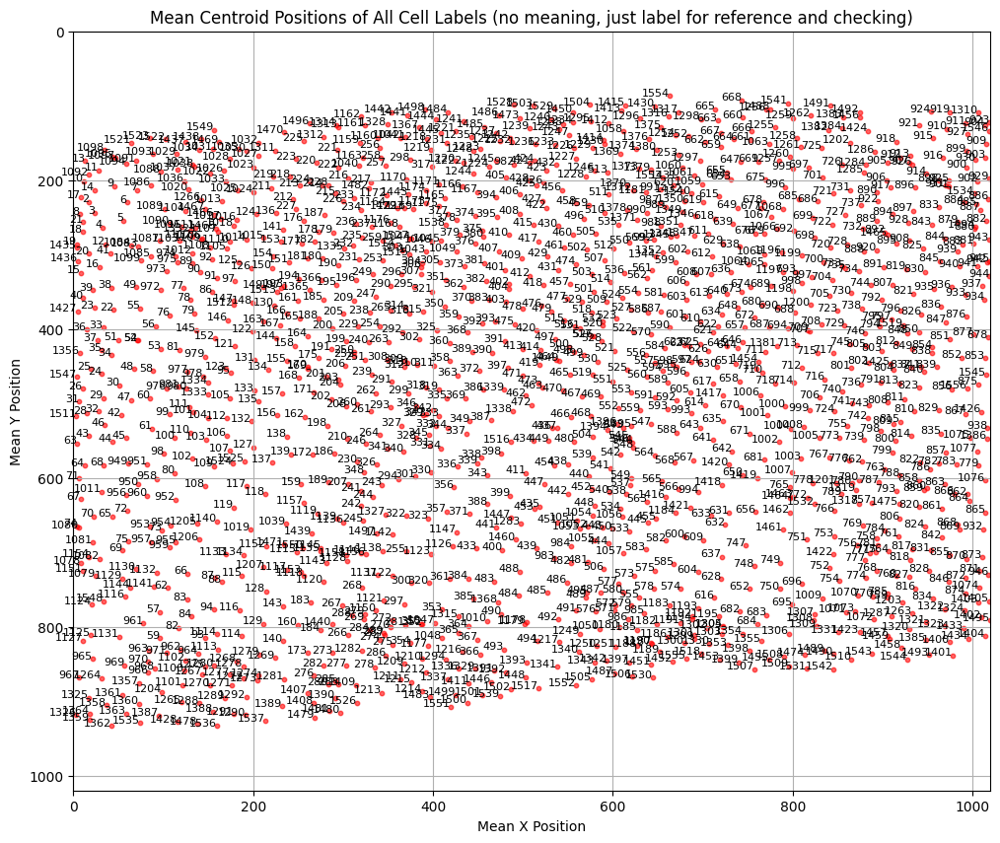

In [15]:
# Plot the mean centroid positions of each label in a 2D plane
plt.figure(figsize=(12, 10))

# Scatter plot for centroid positions
plt.scatter(mean_centroid_df['Mean_X'], mean_centroid_df['Mean_Y'], c='red', s=10, alpha=0.6)

# Add cell labels next to each point
for _, row in mean_centroid_df.iterrows():
    plt.text(row['Mean_X'], row['Mean_Y'], str(int(row['Label'])), fontsize=8, ha='right')

# Set limits for x and y axes
plt.xlim(0, 1020)
plt.ylim(1020, 0)  # Inverted y-axis

# Add title and labels
plt.title("Mean Centroid Positions of All Cell Labels (no meaning, just label for reference and checking)")
plt.xlabel("Mean X Position")
plt.ylabel("Mean Y Position")
plt.grid(True)

# Show plot
plt.show()

### statistics across slices

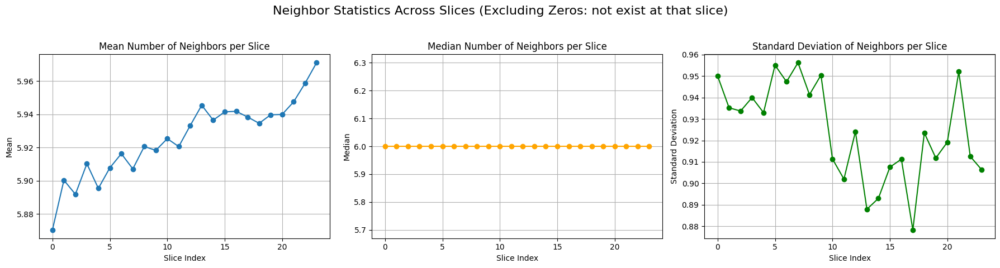

In [16]:
# Exclude zeros and calculate mean, median, and standard deviation for each slice
slice_stats = pd.DataFrame({
    'Mean': neighbor_stats_df.apply(lambda x: x[x != 0].mean(), axis=0),
    'Median': neighbor_stats_df.apply(lambda x: x[x != 0].median(), axis=0),
    'Standard Deviation': neighbor_stats_df.apply(lambda x: x[x != 0].std(), axis=0)
})

# Set up a 1x3 grid for plots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("Neighbor Statistics Across Slices (Excluding Zeros: not exist at that slice)", fontsize=16)

# Mean plot
axes[0].plot(slice_stats.index, slice_stats['Mean'], marker='o', linestyle='-')
axes[0].set_title("Mean Number of Neighbors per Slice")
axes[0].set_xlabel("Slice Index")
axes[0].set_ylabel("Mean")
axes[0].grid(True)

# Median plot
axes[1].plot(slice_stats.index, slice_stats['Median'], marker='o', linestyle='-', color='orange')
axes[1].set_title("Median Number of Neighbors per Slice")
axes[1].set_xlabel("Slice Index")
axes[1].set_ylabel("Median")
axes[1].grid(True)

# Standard Deviation plot
axes[2].plot(slice_stats.index, slice_stats['Standard Deviation'], marker='o', linestyle='-', color='green')
axes[2].set_title("Standard Deviation of Neighbors per Slice")
axes[2].set_xlabel("Slice Index")
axes[2].set_ylabel("Standard Deviation")
axes[2].grid(True)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


### Mean and Standard Deviation of number of neighbours of each cell

#### Use the whole sequence (including the leading and tailing zeros)

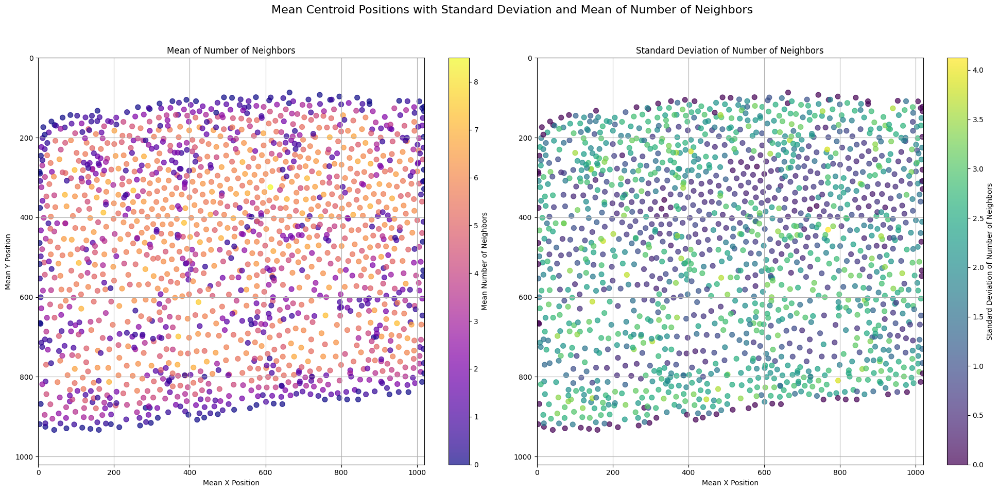

In [17]:
# Calculate the standard deviation and mean for each cell
neighbor_std = neighbor_stats_df.std(axis=1)  # Standard deviation of neighbors for each cell label
neighbor_std.name = 'Std_Neighbors'  # Rename Series for clarity

neighbor_mean = neighbor_stats_df.mean(axis=1)  # Mean of neighbors for each cell label
neighbor_mean.name = 'Mean_Neighbors'  # Rename Series for clarity

# Set up a 1x2 grid for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle("Mean Centroid Positions with Standard Deviation and Mean of Number of Neighbors", fontsize=16)

# Left Plot: Mean of Number of Neighbors
sc1 = axes[0].scatter(mean_centroid_df['Mean_X'], mean_centroid_df['Mean_Y'], 
                      c=neighbor_mean, cmap='plasma', s=50, alpha=0.7)
cbar1 = plt.colorbar(sc1, ax=axes[0])
cbar1.set_label("Mean Number of Neighbors")
axes[0].set_xlim(0, 1020)
axes[0].set_ylim(1020, 0)  # Inverted y-axis
axes[0].set_title("Mean of Number of Neighbors")
axes[0].set_xlabel("Mean X Position")
axes[0].set_ylabel("Mean Y Position")
axes[0].grid(True)

# Right Plot: Standard Deviation of Number of Neighbors
sc2 = axes[1].scatter(mean_centroid_df['Mean_X'], mean_centroid_df['Mean_Y'], 
                      c=neighbor_std, cmap='viridis', s=50, alpha=0.7)
cbar2 = plt.colorbar(sc2, ax=axes[1])
cbar2.set_label("Standard Deviation of Number of Neighbors")
axes[1].set_xlim(0, 1020)
axes[1].set_ylim(1020, 0)  # Inverted y-axis
axes[1].set_title("Standard Deviation of Number of Neighbors")
axes[1].set_xlabel("Mean X Position")
axes[1].grid(True)

# Adjust layout and display plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


##### Looking closer into a smaller specific area

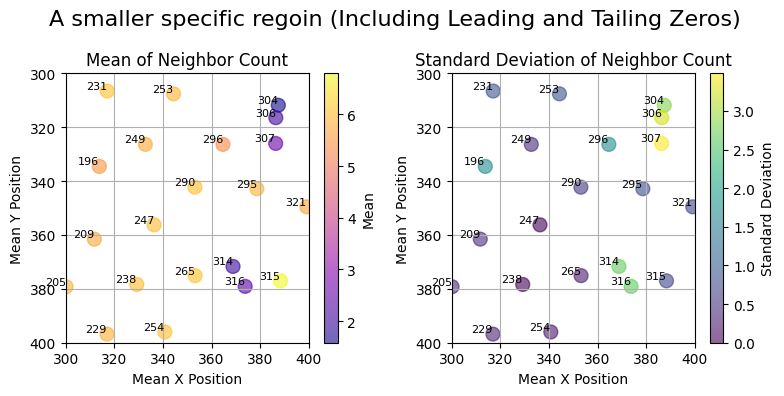

In [18]:
# Step 1: Filter `mean_centroid_df` for labels within the specified area
filtered_data = mean_centroid_df[
    (mean_centroid_df['Mean_X'].between(300, 400)) & 
    (mean_centroid_df['Mean_Y'].between(300, 400))
]

# Step 2: Already Calculated standard deviation and mean of neighbors, trimming leading and trailing zeros

# Step 3: Filter mean and standard deviation for the labels in the specific area
filtered_mean = neighbor_mean[filtered_data['Label']]
filtered_std = neighbor_std[filtered_data['Label']]

# Step 4: Create a 1x2 subplot for mean and standard deviation
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
fig.suptitle("A smaller specific regoin (Including Leading and Tailing Zeros)", fontsize=16)

# ----- First Plot: Mean Number of Neighbors -----
sc1 = axes[0].scatter(filtered_data['Mean_X'], filtered_data['Mean_Y'], 
                      c=filtered_mean, cmap='plasma', s=100, alpha=0.6)

cbar1 = plt.colorbar(sc1, ax=axes[0])
cbar1.set_label("Mean")
axes[0].set_title("Mean of Neighbor Count")
axes[0].set_xlabel("Mean X Position")
axes[0].set_ylabel("Mean Y Position")
axes[0].grid(True)

# ----- Second Plot: Standard Deviation of Neighbors -----
sc2 = axes[1].scatter(filtered_data['Mean_X'], filtered_data['Mean_Y'], 
                      c=filtered_std, cmap='viridis', s=100, alpha=0.6)

cbar2 = plt.colorbar(sc2, ax=axes[1])
cbar2.set_label("Standard Deviation")
axes[1].set_title("Standard Deviation of Neighbor Count")
axes[1].set_xlabel("Mean X Position")
axes[1].set_ylabel("Mean Y Position")
axes[1].grid(True)

# Add cell labels directly on both plots
for _, row in filtered_data.iterrows():
    axes[0].text(row['Mean_X'], row['Mean_Y'], str(int(row['Label'])), fontsize=8, ha='right', va='bottom')
    axes[1].text(row['Mean_X'], row['Mean_Y'], str(int(row['Label'])), fontsize=8, ha='right', va='bottom')

# Set x and y limits to focus on the specified area
for ax in axes:
    ax.set_xlim(300, 400)
    ax.set_ylim(400, 300)  # Inverted y-axis

# Adjust layout and show plot
plt.tight_layout()
plt.show()


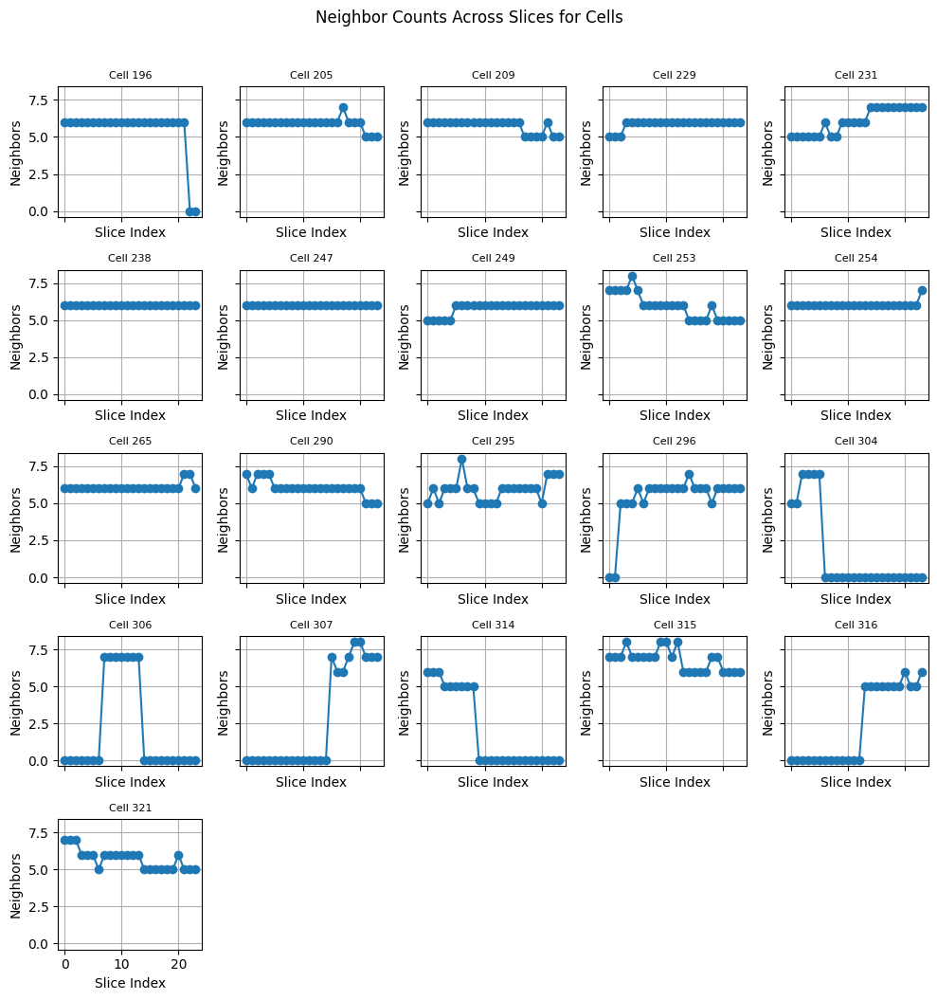

In [19]:
# Step 1: Select up to 25 (more than enough) labels from filtered_data for visualization
chosen_labels = filtered_data['Label'][:25]  

# Step 2: Ensure `neighbor_stats_df` contains neighbor counts for all labels
# Convert neighbor_stats to DataFrame if not already defined
neighbor_stats_df = pd.DataFrame.from_dict(neighbor_stats, orient='index').fillna(0)

# Step 3: Create a 5x5 grid of subplots for neighbor counts across slices for chosen labels
fig, axes = plt.subplots(5, 5, figsize=(10, 10), sharex=True, sharey=True)
axes = axes.flatten()

# Step 4: Plot neighbor counts for each chosen label in the 5x5 grid
for i, label in enumerate(chosen_labels):
    ax = axes[i]
    ax.plot(
        range(neighbor_stats_df.shape[1]),  # Range of slice indices
        neighbor_stats_df.loc[label],       # Neighbor counts for the chosen label
        marker='o', 
        linestyle='-', 
        label=f'Cell {label}'
    )
    ax.set_title(f"Cell {label}", fontsize=8)
    ax.grid(True)
    ax.set_xlabel("Slice Index")
    ax.set_ylabel("Neighbors")

# Step 5: Hide any unused subplots
for j in range(len(chosen_labels), len(axes)):
    axes[j].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.suptitle("Neighbor Counts Across Slices for Cells", y=1.05)
plt.show()


#### Trimming the leading and tailing zeros

In [20]:
# Custom function to trim leading and trailing zeros and any trailing zeros after the last non-zero block
def trim_zeros_custom(arr):
    # Find the first non-zero index
    start = next((i for i, x in enumerate(arr) if x != 0), None)
    # Find the last non-zero index
    end = next((i for i, x in enumerate(arr[::-1]) if x != 0), None)
    
    # If there are no non-zero elements, return an empty array
    if start is None:
        return np.array([])
    
    # Slice the array from start to the calculated endpoint
    trimmed_arr = arr[start:len(arr) - end]
    
    return trimmed_arr

# Calculate standard deviation and mean, ignoring leading and trailing zeros
neighbor_std = neighbor_stats_df.apply(lambda x: np.std(trim_zeros_custom(x.to_numpy())) if trim_zeros_custom(x.to_numpy()).size > 0 else 0, axis=1)
neighbor_mean = neighbor_stats_df.apply(lambda x: np.mean(trim_zeros_custom(x.to_numpy())) if trim_zeros_custom(x.to_numpy()).size > 0 else 0, axis=1)


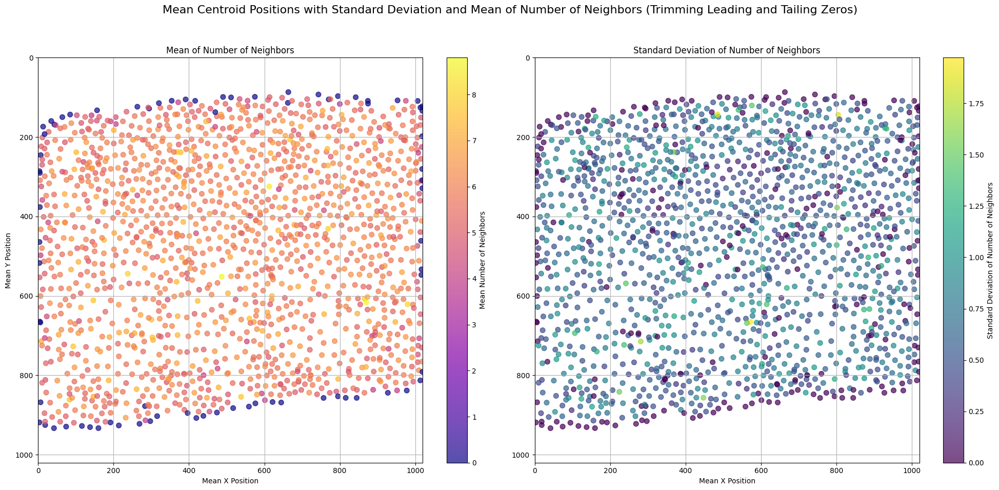

In [21]:
# Set up a 1x2 grid for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle("Mean Centroid Positions with Standard Deviation and Mean of Number of Neighbors (Trimming Leading and Tailing Zeros)", fontsize=16)

# Left Plot: Mean of Number of Neighbors
sc1 = axes[0].scatter(mean_centroid_df['Mean_X'], mean_centroid_df['Mean_Y'], 
                      c=neighbor_mean, cmap='plasma', s=50, alpha=0.7)
cbar1 = plt.colorbar(sc1, ax=axes[0])
cbar1.set_label("Mean Number of Neighbors")
axes[0].set_xlim(0, 1020)
axes[0].set_ylim(1020, 0)  # Inverted y-axis
axes[0].set_title("Mean of Number of Neighbors")
axes[0].set_xlabel("Mean X Position")
axes[0].set_ylabel("Mean Y Position")
axes[0].grid(True)

# Right Plot: Standard Deviation of Number of Neighbors
sc2 = axes[1].scatter(mean_centroid_df['Mean_X'], mean_centroid_df['Mean_Y'], 
                      c=neighbor_std, cmap='viridis', s=50, alpha=0.7)
cbar2 = plt.colorbar(sc2, ax=axes[1])
cbar2.set_label("Standard Deviation of Number of Neighbors")
axes[1].set_xlim(0, 1020)
axes[1].set_ylim(1020, 0)  # Inverted y-axis
axes[1].set_title("Standard Deviation of Number of Neighbors")
axes[1].set_xlabel("Mean X Position")
axes[1].grid(True)

# Adjust layout and display plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [22]:
# Define function to count leading and trailing zeros
def count_zeros(arr):
    # Find the first non-zero index for leading zero count
    start = next((i for i, x in enumerate(arr) if x != 0), len(arr))
    # Find the last non-zero index for trailing zero count
    end = next((i for i, x in enumerate(arr[::-1]) if x != 0), len(arr))
    
    leading_zeros = start
    trailing_zeros = end
    
    return leading_zeros, trailing_zeros

# Calculate leading and trailing zeros
leading_zeros_count = neighbor_stats_df.apply(lambda x: count_zeros(x.to_numpy())[0], axis=1)
trailing_zeros_count = neighbor_stats_df.apply(lambda x: count_zeros(x.to_numpy())[1], axis=1)



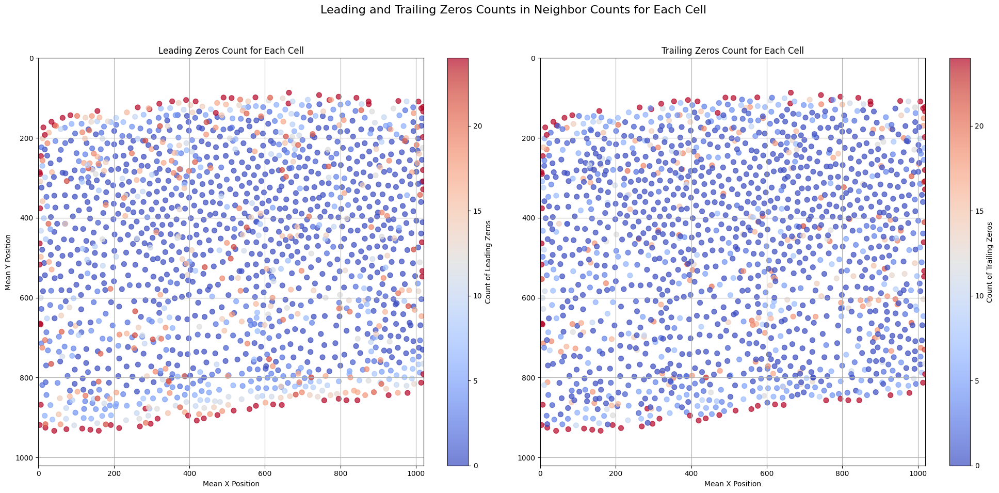

In [23]:
# Set up a 1x2 grid for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle("Leading and Trailing Zeros Counts in Neighbor Counts for Each Cell", fontsize=16)

# Left Plot: Leading Zeros Count
sc1 = axes[0].scatter(mean_centroid_df['Mean_X'], mean_centroid_df['Mean_Y'], 
                      c=leading_zeros_count, cmap='coolwarm', s=50, alpha=0.7)
cbar1 = plt.colorbar(sc1, ax=axes[0])
cbar1.set_label("Count of Leading Zeros")
axes[0].set_xlim(0, 1020)
axes[0].set_ylim(1020, 0)  # Inverted y-axis
axes[0].set_title("Leading Zeros Count for Each Cell")
axes[0].set_xlabel("Mean X Position")
axes[0].set_ylabel("Mean Y Position")
axes[0].grid(True)

# Right Plot: Trailing Zeros Count
sc2 = axes[1].scatter(mean_centroid_df['Mean_X'], mean_centroid_df['Mean_Y'], 
                      c=trailing_zeros_count, cmap='coolwarm', s=50, alpha=0.7)
cbar2 = plt.colorbar(sc2, ax=axes[1])
cbar2.set_label("Count of Trailing Zeros")
axes[1].set_xlim(0, 1020)
axes[1].set_ylim(1020, 0)  # Inverted y-axis
axes[1].set_title("Trailing Zeros Count for Each Cell")
axes[1].set_xlabel("Mean X Position")
axes[1].grid(True)

# Adjust layout and display plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

##### Looking closer into a smaller specific area

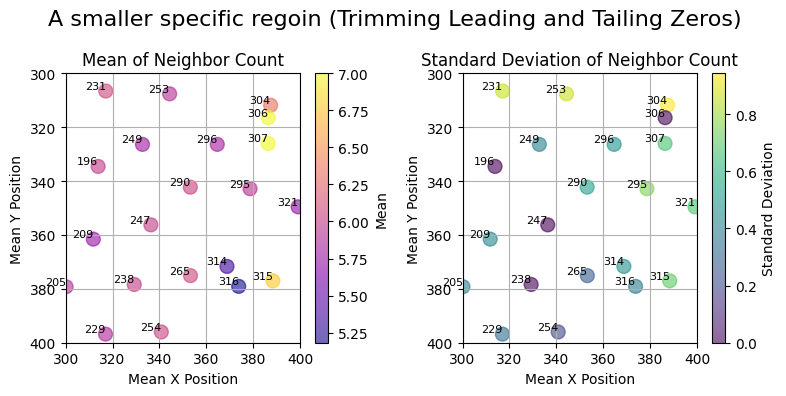

In [24]:
# Step 1: Filter `mean_centroid_df` for labels within the specified area
filtered_data = mean_centroid_df[
    (mean_centroid_df['Mean_X'].between(300, 400)) & 
    (mean_centroid_df['Mean_Y'].between(300, 400))
]

# Step 2: Already Calculated standard deviation and mean of neighbors, trimming leading and trailing zeros

# Step 3: Filter mean and standard deviation for the labels in the specific area
filtered_mean = neighbor_mean[filtered_data['Label']]
filtered_std = neighbor_std[filtered_data['Label']]

# Step 4: Create a 1x2 subplot for mean and standard deviation
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
fig.suptitle("A smaller specific regoin (Trimming Leading and Tailing Zeros)", fontsize=16)

# ----- First Plot: Mean Number of Neighbors -----
sc1 = axes[0].scatter(filtered_data['Mean_X'], filtered_data['Mean_Y'], 
                      c=filtered_mean, cmap='plasma', s=100, alpha=0.6)

cbar1 = plt.colorbar(sc1, ax=axes[0])
cbar1.set_label("Mean")
axes[0].set_title("Mean of Neighbor Count")
axes[0].set_xlabel("Mean X Position")
axes[0].set_ylabel("Mean Y Position")
axes[0].grid(True)

# ----- Second Plot: Standard Deviation of Neighbors -----
sc2 = axes[1].scatter(filtered_data['Mean_X'], filtered_data['Mean_Y'], 
                      c=filtered_std, cmap='viridis', s=100, alpha=0.6)

cbar2 = plt.colorbar(sc2, ax=axes[1])
cbar2.set_label("Standard Deviation")
axes[1].set_title("Standard Deviation of Neighbor Count")
axes[1].set_xlabel("Mean X Position")
axes[1].set_ylabel("Mean Y Position")
axes[1].grid(True)

# Add cell labels directly on both plots
for _, row in filtered_data.iterrows():
    axes[0].text(row['Mean_X'], row['Mean_Y'], str(int(row['Label'])), fontsize=8, ha='right', va='bottom')
    axes[1].text(row['Mean_X'], row['Mean_Y'], str(int(row['Label'])), fontsize=8, ha='right', va='bottom')

# Set x and y limits to focus on the specified area
for ax in axes:
    ax.set_xlim(300, 400)
    ax.set_ylim(400, 300)  # Inverted y-axis

# Adjust layout and show plot
plt.tight_layout()
plt.show()
